# Homework Assignment 3

### Preperations: 

In [ ]:
! pip install kaggle 
! pip install turicreate
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json 
# download the dataset
! kaggle datasets download city-of-seattle/seattle-library-collection-inventory
! unzip seattle-library-collection-inventory.zip

     |████████████████████████████████| 92.0 MB 5.8 kB/s 
     |████████████████████████████████| 3.6 MB 31.1 MB/s 
     |████████████████████████████████| 3.5 MB 26.7 MB/s 
     |████████████████████████████████| 86.4 MB 56 kB/s 
     |████████████████████████████████| 322 kB 63.9 MB/s 
     |████████████████████████████████| 18.3 MB 85 kB/s 
     |████████████████████████████████| 2.9 MB 41.3 MB/s 
     |████████████████████████████████| 449 kB 31.3 MB/s 
     |████████████████████████████████| 50 kB 6.0 MB/s 
     |████████████████████████████████| 20.1 MB 1.3 MB/s 
     |████████████████████████████████| 3.8 MB 15.1 MB/s 
  Created wheel for prettytable: filename=prettytable-0.7.2-py3-none-any.whl size=13714 sha256=458dfd2e38fc844523d4dadfa29153763041245f8b0e1b842e83040da601a279
  Stored in directory: /root/.cache/pip/wheels/b2/7f/f6/f180315b584f00445045ff1699b550fa895d09471337ce21c6
  Created wheel for resampy: filename=resampy-0.2.1-py3-none-any.whl size=320860 sha256=454d467a946

100% 3.76G/3.77G [01:09<00:00, 56.5MB/s]
100% 3.77G/3.77G [01:09<00:00, 57.9MB/s]
Archive:  seattle-library-collection-inventory.zip
  inflating: CollectionInventory_Codes_EXCLUDED_INCLUDED.xlsx  
  inflating: Library Collection Inventory FAQs.pdf  
  inflating: library-collection-inventory.csv  y
y


In [ ]:
#IMPORTS:
import os
import re
import numpy as np
from typing import *
from turicreate import SFrame, SArray
import turicreate.aggregate as turi_agg
import seaborn as sns

In [ ]:
csv_file_path = 'library-collection-inventory.csv'
library_sf = SFrame.read_csv(csv_file_path)

Successfully parsed 10 tokens: 
	0: 735439
	1: ["Genealog ... t.",,1947]
	2: 
	3: Enloes family
	4: arbk
	5: caref
	6: 
	7: cen
	8: 2017-09-01 ... :00:00.000
	9: 1

1 lines failed to parse correctly

Finished parsing file /content/library-collection-inventory.csv

Parsing completed. Parsed 100 lines in 2.0348 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,str,str,str,str,str,str,str,str,str,str,str,int]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Successfully parsed 10 tokens: 
	0: 735439
	1: [Genealogy ... t.",,1947]
	2: 
	3: Enloes family
	4: arbk
	5: caref
	6: 
	7: cen
	8: 2017-09-01 ... :00:00.000
	9: 1

Read 158429 lines. Lines per second: 76511.2

Successfully parsed 9 tokens: 
	0: 362786
	1: [Records., ... l Society]
	2: Registers  ... astchester
	3: arbk
	4: caref
	5: 
	6: cen
	7: 2017-09-01 ... :00:00.000
	8: 1

Read 950646 lines. Lines per second: 125093

Successfully parsed 10 tokens: 
	0: 28078
	1: [Papers.," ... 9)",,1969]
	2: 
	3: Genealogy Congresses
	4: arbk
	5: caref
	6: 
	7: cen
	8: 2017-09-01 ... :00:00.000
	9: 6

Successfully parsed 9 tokens: 
	0: 362786
	1: [Records., ... l Society]
	2: Registers  ... astchester
	3: arbk
	4: caref
	5: 
	6: cen
	7: 2017-10-01 ... :00:00.000
	8: 1

Read 1741935 lines. Lines per second: 130151

Successfully parsed 10 tokens: 
	0: 735439
	1: [Genealogy ... t.",,1947]
	2: 
	3: Enloes family
	4: arbk
	5: caref
	6: 
	7: cen
	8: 2017-10-01 ... :00:00.000
	9: 1

Successfully parsed 10 tokens: 
	0: 28078
	1: [Papers.," ... 9)",,1969]
	2: 
	3: Genealogy Congresses
	4: arbk
	5: caref
	6: 
	7: cen
	8: 2017-10-01 ... :00:00.000
	9: 6

Successfully parsed 10 tokens: 
	0: 735439
	1: [Genealogy ... t.",,1947]
	2: 
	3: Enloes family
	4: arbk
	5: caref
	6: 
	7: cen
	8: 2017-11-01 ... :00:00.000
	9: 1

Read 2532886 lines. Lines per second: 131678

Successfully parsed 10 tokens: 
	0: 28078
	1: [Papers.," ... 9)",,1969]
	2: 
	3: Genealogy Congresses
	4: arbk
	5: caref
	6: 
	7: cen
	8: 2017-11-01 ... :00:00.000
	9: 6

Read 3323492 lines. Lines per second: 130485

Successfully parsed 9 tokens: 
	0: 362786
	1: [Records., ... l Society]
	2: Registers  ... astchester
	3: arbk
	4: caref
	5: 
	6: cen
	7: 2017-11-01 ... :00:00.000
	8: 1

Read 4114706 lines. Lines per second: 130244

Read 4760162 lines. Lines per second: 129964

Read 5405425 lines. Lines per second: 129638

Read 6049926 lines. Lines per second: 129320

Read 6694080 lines. Lines per second: 127379

Read 7336799 lines. Lines per second: 127122

Read 7979800 lines. Lines per second: 126730

Read 8621649 lines. Lines per second: 126405

Read 9263355 lines. Lines per second: 125930

Read 9904635 lines. Lines per second: 125562

Read 10545914 lines. Lines per second: 125031

Read 11186676 lines. Lines per second: 124604

Successfully parsed 12 tokens: 
	0: 1975146
	1: The foods  ... a Kremezi.
	2: Kremezi, Aglaia
	3: 0395982111
	4: 2000.
	5: Houghton Mifflin,
	6: Molyvos Re ... king Greek
	7: acbk
	8: canf
	9: 
	10: cen
	11: 2018

10 lines failed to parse correctly

Finished parsing file /content/library-collection-inventory.csv

Parsing completed. Parsed 11435117 lines in 90.9982 secs.

In [ ]:
library_sf.show()

Materializing SFrame

In [ ]:
library_sf.head()

BibNum,Title,Author,ISBN,PublicationYear
3011076,A tale of two friends /adapted by Ellie O'Ry ...,"O'Ryan, Ellie","1481425730, 1481425749,9781481425735, ...",2014.
2248846,"Naruto. Vol. 1, UzumakiNaruto / story and ar ...","Kishimoto, Masashi, 1974-",1569319006,"2003, c1999."
3209270,"Peace, love & Wi-Fi : aZITS treasury / by Jerry ...","Scott, Jerry, 1955-","144945867X, 9781449458676",2014.
1907265,The Paris pilgrims : anovel / Clancy Carlile. ...,"Carlile, Clancy, 1930-",0786706155,c1999.
1644616,"Erotic by nature : acelebration of life, of ...",,094020813X,"1991, c1988."
1736505,Children of Cambodia'skilling fields : memoirs ...,,"0300068395, 0300078730",c1997.
1749492,Anti-Zionism : analyticalreflections / editors: ...,,091559773X,c1989.
3270562,Hard-hearted Highlander /Julia London. ...,"London, Julia","0373789998, 037380394X,9780373789993, ...",[2017]
3264577,The Sandcastle Empire /Kayla Olson. ...,"Olson, Kayla","0062484877, 9780062484871",2017.
3236819,Doctor Who. The return ofDoctor Mysterio / BBC ; ...,,,[2017]


### Q&A:

Using the [Seattle Library Collection Inventory Dataset](https://www.kaggle.com/city-of-seattle/seattle-library-collection-inventory#library-collection-inventory.csv) and TuriCreate please, answer the following questions:

**Question 1:** Write a function that returns the most popular book in each subject. Use it to find the most popular book in
    the _Mystery Fiction_ subject (15pt)

In [ ]:
import turicreate.aggregate as turi_agg

def most_popular_title_by_subject(sframe_to_analyze: SFrame, subject_to_analyze_by: str = 'Mystery Fiction'):
  # reducing the size of the sframe for quicker analysis
  only_subject_sframe = sframe_to_analyze['Title','Subjects']
  # converting the string of multiple subjects to a list object
  only_subject_sframe['subjects_lst'] = only_subject_sframe['Subjects'].apply(lambda subjects_str: subjects_str.split(','))
  only_subject_sframe['subjects_lst'] = only_subject_sframe['subjects_lst'].apply(lambda subjects_lst: [subject.strip() for subject in subjects_lst])
  only_subjects_sframe = only_subjects_sframe.remove_column('Subjects')

  # stack by subject 
  stacked_sframe = only_subject_sframe.stack('subjects_lst', new_column_name='subject')
  stacked_sframe = stacked_sframe[stacked_sframe['subject' == subject_to_analyze_by]]
  by_subject_sframe = stacked_sframe.groupby('Title', {'titleCountInSubject': turi_agg.COUNT()})
  # remove rows where title is NaN or '' or None
  by_subject_sframe_no_na = by_subject_sframe[by_subject_sframe['Title']!='']
  by_subject_sframe_no_na = by_subject_sframe_no_na.dropna()
  
  return by_subject_sframe_no_na.sort('titleCountInSubject', ascending=False)[0]['Title']

most_popular_title_by_subject(library_sf)

'El deafo / Cece Bell ; color by David Lasky.'

**Question 2**: Find the top-10 fiction subjects (5pt), and use Seaborn to visualize the number of items over time for each subject (15pt)
    

In [ ]:
def get_top_ten_fiction_subjects(sframe_to_analyze):
  #  work only with subjects SArray to use less space
  only_subjects_sframe = sframe_to_analyze['Subjects', 'Title']
  # converting the string of multiple subjects to a list object with all lower case versions of subjects
  only_subjects_sframe['subjects_lst'] = only_subjects_sframe['Subjects'].apply(lambda subjects_str: subjects_str.split(','))
  only_subjects_sframe['subjects_lst'] = only_subjects_sframe['subjects_lst'].apply(lambda subjects_lst: [subject.strip().lower() for subject in subjects_lst])
  only_subjects_sframe = only_subjects_sframe.remove_column('Subjects')

  # stack by subject 
  stacked_sframe = only_subjects_sframe.stack('subjects_lst', new_column_name='subject')

  # add a new colum where for each subject appears whether it contains 'fiction' or not
  stacked_sframe['fictionFlag'] = stacked_sframe['subject'].apply(lambda subject_name: int('fiction' in subject_name))
  
  # sum the fictionFlag values
  subject_fiction_sum_sframe = stacked_sframe.groupby('subject', {'fictionCounts': turi_agg.SUM('fictionFlag')})
  
  # sort and take top 10
  top_ten_fiction_subjects = subject_fiction_sum_sframe.sort('fictionCounts', ascending=False)[:10]
  return top_ten_fiction_subjects['subject']

top_ten_fiction_subjects = get_top_ten_fiction_subjects(library_sf)
  

In [ ]:
r = re.compile('\\d{4}')
def get_year(y_str):
    l = r.findall(y_str) # take the first year
    if len(l) == 0:
        return None
    return int(l[0])

def get_subject_appearances_by_years(sframe_to_analyze: SFrame, subjects: List[str]):
  #  work only with subjects SArray to use less space and clean from NaN/None/'' values
  only_subjects_sframe = sframe_to_analyze['Subjects', 'PublicationYear']
  only_subjects_sframe = only_subjects_sframe.dropna()
  only_subjects_sframe = only_subjects_sframe[only_subjects_sframe['PublicationYear']!='']
  only_subjects_sframe = only_subjects_sframe[only_subjects_sframe['PublicationYear']!=None]

  only_subjects_sframe = only_subjects_sframe.rename({'PublicationYear':'year'})
  # converting the string of multiple subjects to a list object with all lower case versions of subjects
  only_subjects_sframe['subjects_lst'] = only_subjects_sframe['Subjects'].apply(lambda subjects_str: subjects_str.split(','))
  only_subjects_sframe['subjects_lst'] = only_subjects_sframe['subjects_lst'].apply(lambda subjects_lst: [subject.strip().lower() for subject in subjects_lst])
  only_subjects_sframe = only_subjects_sframe.remove_column('Subjects')
  
  # stack by subject 
  stacked_sframe = only_subjects_sframe.stack('subjects_lst', new_column_name='subject')
  # filter by subjects of interest
  filtered_stacked_sframe = stacked_sframe.filter_by(subjects, 'subject')
  # clean year values
  filtered_stacked_sframe['year'] = filtered_stacked_sframe['year'].apply(lambda s: get_year(s))
  filtered_stacked_sframe = filtered_stacked_sframe[filtered_stacked_sframe['year']!='']
  filtered_stacked_sframe = filtered_stacked_sframe[filtered_stacked_sframe['year']!=None]

  # for each subject, count the number of appearances for each year
  subject_year_count = filtered_stacked_sframe.groupby(['subject', 'year'], {'subject_in_year': turi_agg.COUNT()})
  return subject_year_count

# using only 100K samples due to time constraints:
top_ten_fiction_subjects_by_year_counts = get_subject_appearances_by_years(library_sf[:100000], list(top_ten_fiction_subjects)) 


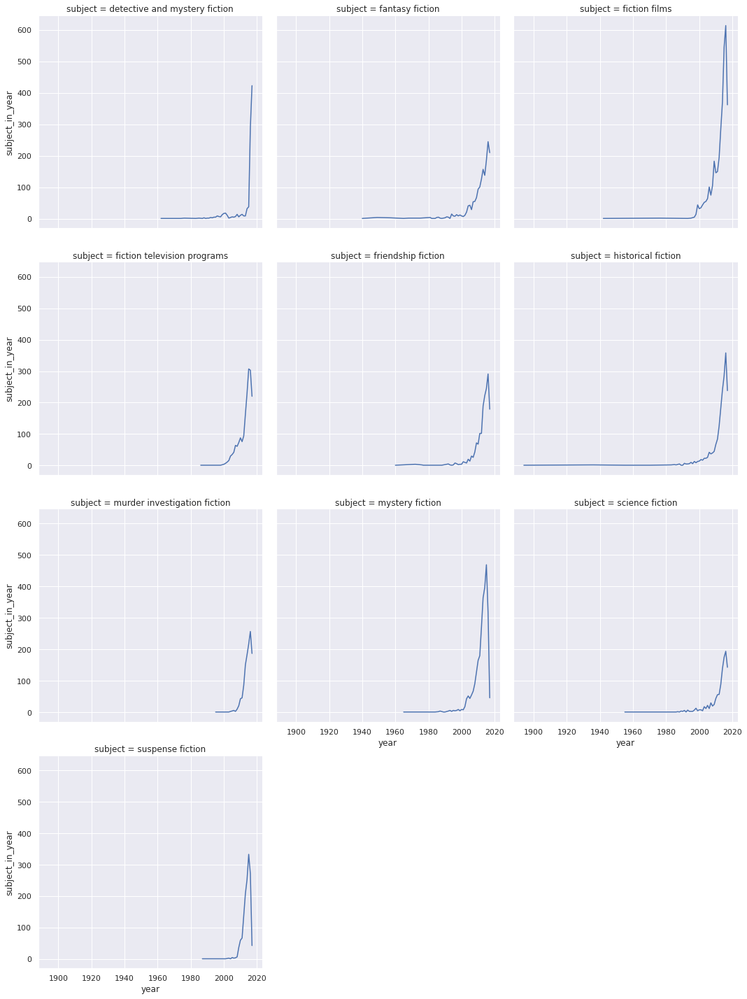

In [ ]:
# get the entire range of years in dataset
min_year, max_year = top_ten_fiction_subjects_by_year_counts['year'].min() , top_ten_fiction_subjects_by_year_counts['year'].max()
range_of_years = np.arange(min_year, max_year + 1, 1)
top_ten_fiction_subjects_by_year_counts = top_ten_fiction_subjects_by_year_counts.sort(['subject', 'year'], ascending=True)
unique_subjects_names =  top_ten_fiction_subjects_by_year_counts['subject'].unique()

count_of_years_by_subject = {}

for subject in unique_subjects_names:
  count_per_year = np.zeros_like(range_of_years, dtype=np.int32)
  single_subject_sframe = top_ten_fiction_subjects_by_year_counts[top_ten_fiction_subjects_by_year_counts['subject']==subject]
  # get all appearances by years 
  for row in single_subject_sframe:
    year, count = row['year'], row['subject_in_year']
    count_per_year[np.where(range_of_years==year)[0][0]] = count
  
  count_of_years_by_subject[subject] = count_per_year.copy()

# plotting:
sns.set(rc={'figure.figsize':(20, 50)})
sns.relplot(
    data=top_ten_fiction_subjects_by_year_counts.to_dataframe(), kind="line",
    x="year", y="subject_in_year", col="subject",
    facet_kws=dict(sharex=True),
    col_wrap=3
)

**Question 3:** Write a function that gets as input a subject name. The function returns the top-20 most _popular_ authors for the input subject (15pt).



In [ ]:
def top_20_authors_of_subject(sframe_to_analyze: SFrame, subject_name: str):
  subject_name = subject_name.lower()
  #  work only with subjects SArray to use less space and clean from NaN/None/'' values
  only_subjects_sframe = sframe_to_analyze['Subjects', 'Author']
  only_subjects_sframe = only_subjects_sframe.dropna()
  # converting the string of multiple subjects to a list object with all lower case versions of subjects
  only_subjects_sframe['subjects_lst'] = only_subjects_sframe['Subjects'].apply(lambda subjects_str: subjects_str.split(','))
  only_subjects_sframe['subjects_lst'] = only_subjects_sframe['subjects_lst'].apply(lambda subjects_lst: [subject.strip().lower() for subject in subjects_lst])
  only_subjects_sframe = only_subjects_sframe.remove_column('Subjects')
  
  # stack by subject 
  stacked_sframe = only_subjects_sframe.stack('subjects_lst', new_column_name='subject')
  
  # reduce to the subject in question only by filter 
  filtered_stacked_sframe = stacked_sframe.filter_by(subject_name, 'subject')

  # group by author name and count its appearances, retrieving the top 20 authors by appearances numbers
  count_by_author_of_subject = filtered_stacked_sframe.groupby('Author', {'authorCounts': turi_agg.COUNT()}).sort('authorCounts', ascending=False)
  top_20_count_by_author_of_subject = count_by_author_of_subject[:20]
  return list(top_20_count_by_author_of_subject['Author'])

top_20_authors = top_20_authors_of_subject(library_sf, 'suspense fiction')


In [ ]:
top_20_authors

['Patterson, James, 1947-',
 'Woods, Stuart',
 'King, Stephen, 1947-',
 'Cussler, Clive',
 'Clark, Mary Higgins',
 'Coulter, Catherine',
 'Child, Lee',
 'Grisham, John',
 'Coben, Harlan, 1962-',
 'Johansen, Iris',
 'Baldacci, David',
 'Box, C. J.',
 'Thor, Brad',
 'Gardner, Lisa',
 'Evanovich, Janet',
 'King, Laurie R.',
 'Scottoline, Lisa',
 'Kellerman, Jonathan',
 'Preston, Douglas J.',
 'Sandford, John, 1944 February 23-']

Using the [The Blog Authorship Corpus](http://u.cs.biu.ac.il/~koppel/BlogCorpus.htm) and TuriCreate, please answer the following questions:

### Preperations:

In [ ]:
! pip install kaggle 
! pip install turicreate
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json 
# download the dataset
! kaggle datasets download rtatman/blog-authorship-corpus
! unzip blog-authorship-corpus.zip

mkdir: cannot create directory ‘/root/.kaggle’: File exists
blog-authorship-corpus.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  blog-authorship-corpus.zip
  inflating: blogtext.csv            


In [ ]:
#IMPORTS:
import os
import re
import numpy as np
from typing import *
from turicreate import SFrame, SArray
import turicreate.aggregate as turi_agg
import seaborn as sns

In [ ]:
blog_authorship_raw_sframe = SFrame.read_csv('blogtext.csv')

Finished parsing file /content/blogtext.csv

Parsing completed. Parsed 100 lines in 1.58448 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,str,int,str,str,str,str]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Read 44265 lines. Lines per second: 25180.1

Read 319008 lines. Lines per second: 44479.7

Read 579690 lines. Lines per second: 45988.7

Finished parsing file /content/blogtext.csv

Parsing completed. Parsed 681284 lines in 14.0995 secs.

In [ ]:
blog_authorship_raw_sframe.show()

Materializing SFrame

In [ ]:
blog_authorship_raw_sframe.head()

id,gender,age,topic,sign,date,text
2059027,male,15,Student,Leo,"14,May,2004","Info has beenfound (+/- 100 pages, ..."
2059027,male,15,Student,Leo,"13,May,2004",These are theteam members: Drewes ...
2059027,male,15,Student,Leo,"12,May,2004",In het kadervan kernfusie op aarde: ...
2059027,male,15,Student,Leo,"12,May,2004",testing!!!testing!!! ...
3581210,male,33,InvestmentBanking,Aquarius,"11,June,2004",Thanks toYahoo!'s Toolbar I can ...
3581210,male,33,InvestmentBanking,Aquarius,"10,June,2004",I had aninteresting conversation ...
3581210,male,33,InvestmentBanking,Aquarius,"10,June,2004",SomehowCoca-Cola has a way of ...
3581210,male,33,InvestmentBanking,Aquarius,"10,June,2004","If anything,Korea is a country of ..."
3581210,male,33,InvestmentBanking,Aquarius,"10,June,2004",Take a readof this news article ...
3581210,male,33,InvestmentBanking,Aquarius,"09,June,2004",I surf theEnglish news sites a lot ...


### Q4 Answer:

**Question 4:** Calculate the average and median age of bloggers in each topic by gender(5pt). 
Calculate the average and median age of bloggers according to their sign (5pt). 
Visualize the age distributions  of bloggers according to their  topic and gender using Seaborn and PlotlyExpress(15pt)

In [ ]:
def calculate_avg_and_media_in_topic_by_gender(sframe_to_analyze: SFrame): #, gender_options: List[str]):
  #  clean sframe from missing values
  sframe_to_analyze = sframe_to_analyze.dropna() 
  # group by topic and calculate average and median age
  avg_and_median_by_topic_by_gender_sframe = sframe_to_analyze.groupby(['topic', 'gender'], {'averageAge': turi_agg.MEAN('age'), 'medianAge': turi_agg.QUANTILE('age', 0.5)})
  
  female_results = avg_and_median_by_topic_by_gender_sframe[avg_and_median_by_topic_by_gender_sframe['gender']=='female']
  male_results = avg_and_median_by_topic_by_gender_sframe[avg_and_median_by_topic_by_gender_sframe['gender']=='male']
  return female_results, male_results, avg_and_median_by_topic_by_gender_sframe

def calculate_avg_and_median_age_by_sign(sframe_to_analyze: SFrame):
  #  clean sframe from missing values
  sframe_to_analyze = sframe_to_analyze.dropna() 
  # group by topic and calculate average and median age
  avg_and_median_age_by_sign_sframe = sframe_to_analyze.groupby(['sign'], {'averageAge': turi_agg.MEAN('age'), 'medianAge': turi_agg.QUANTILE('age', 0.5)})
  return avg_and_median_age_by_sign_sframe

female_results_avg_and_median_by_topic, male_results_avg_and_median_by_topic, all_genders_results_avg_and_median_by_topic = calculate_avg_and_media_in_topic_by_gender(blog_authorship_raw_sframe)
avg_and_median_age_by_sign = calculate_avg_and_median_age_by_sign(blog_authorship_raw_sframe)

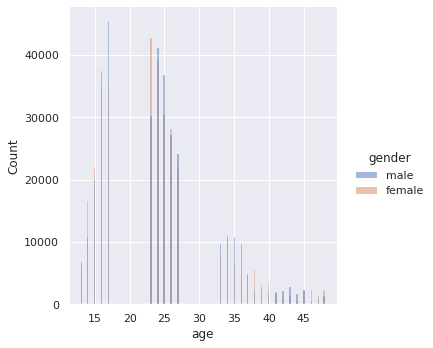

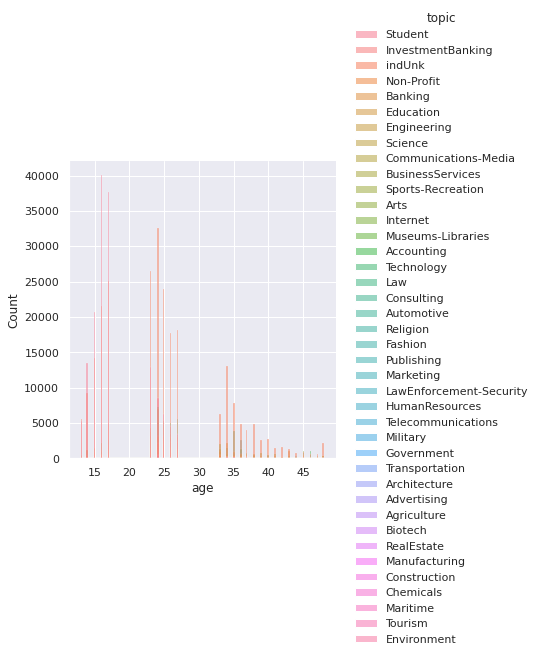

In [ ]:
# SEABORN
# simple age distribution by gender/topic
blog_authorship_raw_sframe = blog_authorship_raw_sframe.dropna()
sns.displot(blog_authorship_raw_sframe.to_dataframe(), x="age", hue="gender")
sns.displot(blog_authorship_raw_sframe.to_dataframe(), x="age", hue="topic")

<Figure size 720x720 with 0 Axes>

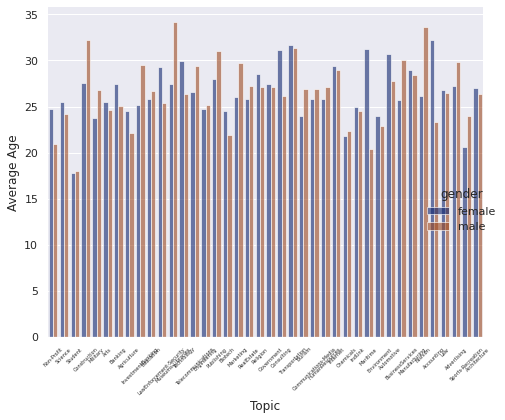

In [ ]:
# SEABORN
# age average by topic by gender
import matplotlib.pyplot as plt

plt.figure()

g = sns.catplot(
    data=all_genders_results_avg_and_median_by_topic.to_dataframe(), kind="bar",
    x="topic", y="averageAge", hue="gender",
    ci="sd", palette="dark", alpha=.6, height=6
)

g.despine(left=True)
g.set_axis_labels("Topic", "Average Age")

locs, labels = plt.xticks()
plt.setp(labels, rotation=45, fontsize=5)

plt.tight_layout()

In [ ]:
blog_authorship_raw_sframe.head()

id,gender,age,topic,sign,date,text
2059027,male,15,Student,Leo,"14,May,2004","Info has beenfound (+/- 100 pages, ..."
2059027,male,15,Student,Leo,"13,May,2004",These are theteam members: Drewes ...
2059027,male,15,Student,Leo,"12,May,2004",In het kadervan kernfusie op aarde: ...
2059027,male,15,Student,Leo,"12,May,2004",testing!!!testing!!! ...
3581210,male,33,InvestmentBanking,Aquarius,"11,June,2004",Thanks toYahoo!'s Toolbar I can ...
3581210,male,33,InvestmentBanking,Aquarius,"10,June,2004",I had aninteresting conversation ...
3581210,male,33,InvestmentBanking,Aquarius,"10,June,2004",SomehowCoca-Cola has a way of ...
3581210,male,33,InvestmentBanking,Aquarius,"10,June,2004","If anything,Korea is a country of ..."
3581210,male,33,InvestmentBanking,Aquarius,"10,June,2004",Take a readof this news article ...
3581210,male,33,InvestmentBanking,Aquarius,"09,June,2004",I surf theEnglish news sites a lot ...


In [ ]:
# PlotlyExpress
# simple age distribution by gender/topic
# i decided to use boxplots, as they provide a complete distribution overview
#  with a clean an simple visualization. 
import plotly.express as px
df = blog_authorship_raw_sframe.dropna().to_dataframe()
fig = px.box(df, x="topic", y="age", color="gender", notched=True)
fig.show()

In [ ]:
# PlotlyExpress
# age average by topic by gender
import matplotlib.pyplot as plt
import plotly.express as px


df = all_genders_results_avg_and_median_by_topic.to_dataframe()
fig = px.bar(df, x="topic", y="averageAge", color="gender")
fig.show()

### Q5 Preperations:

In [ ]:
#IMPORTS:
import os
import re
import numpy as np
from typing import *
from turicreate import SFrame, SArray
import turicreate.aggregate as turi_agg
import seaborn as sns

In [ ]:
sjr_ranking_sframe_raw = SFrame.read_csv('scimagojr 2020.csv', delimiter=';')

Finished parsing file /content/scimagojr 2020.csv

Parsing completed. Parsed 100 lines in 0.456223 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,int,str,str,str,str,str,int,int,int,int,int,int,str,str,str,str,str,str,str]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file /content/scimagojr 2020.csv

Parsing completed. Parsed 32952 lines in 0.311122 secs.

In [ ]:
sjr_ranking_sframe_raw.show()

Materializing SFrame

In [ ]:
sjr_ranking_sframe_raw.head()

Rank,Sourceid,Title,Type,Issn,SJR,SJR Best Quartile,H index
1,28773,Ca-A Cancer Journal forClinicians ...,journal,"15424863, 00079235","62,937",Q1,168
2,19434,MMWR Recommendations andReports ...,journal,"10575987, 15458601","40,949",Q1,143
3,20315,Nature Reviews MolecularCell Biology ...,journal,"14710072, 14710080","37,461",Q1,431
4,29431,Quarterly Journal ofEconomics ...,journal,"00335533, 15314650","34,573",Q1,259
5,21100812243,Nature Reviews Materials,journal,20588437,"32,011",Q1,108
6,58530,National vital statisticsreports : from the ...,journal,"15518922, 15518930","28,083",Q1,100
7,18434,Cell,journal,"00928674, 10974172","26,304",Q1,776
8,18991,Nature Reviews Genetics,journal,"14710056, 14710064","26,214",Q1,365
9,29719,Reviews of Modern Physics,journal,"00346861, 15390756","24,877",Q1,363
10,24404,Journal of PoliticalEconomy ...,journal,"00223808, 1537534X","21,034",Q1,186


In [ ]:
len(sjr_ranking_sframe_raw)

32952

### Q5 Answer:

**Question 5:** Using the  [SJR Journal Ranking of 2018](https://www.scimagojr.com/journalrank.php) dataset and Seaborn, visualize
    the H-index distributions according to the SJR Best Quartile (15pt). Using a grid, visualize the _Cites / Doc. (2years)_ histograms values of each publisher (15pt).
    


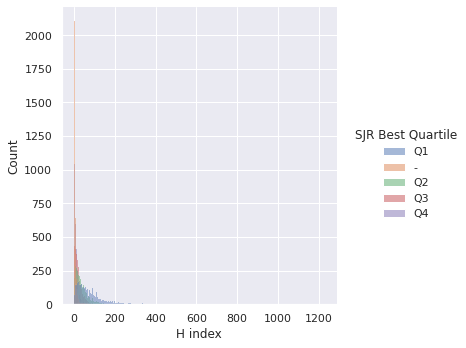

In [ ]:
# H-index distributions according to the SJR Best Quartile:
sjr_ranking_sframe = sjr_ranking_sframe_raw.dropna()
# i decided to leave the '-' value in the SJR Best Quartile column as it is 7055/32952 rows, which is significant
# to remove the rows containing this value, simply uncomment the line below and rerun the cell:
# sjr_ranking_sframe = sjr_ranking_sframe[sjr_ranking_sframe['SJR Best Quartile']!='-']
sns.displot(sjr_ranking_sframe.to_dataframe(), x="H index", hue="SJR Best Quartile")

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:88: UserWarning:

Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations



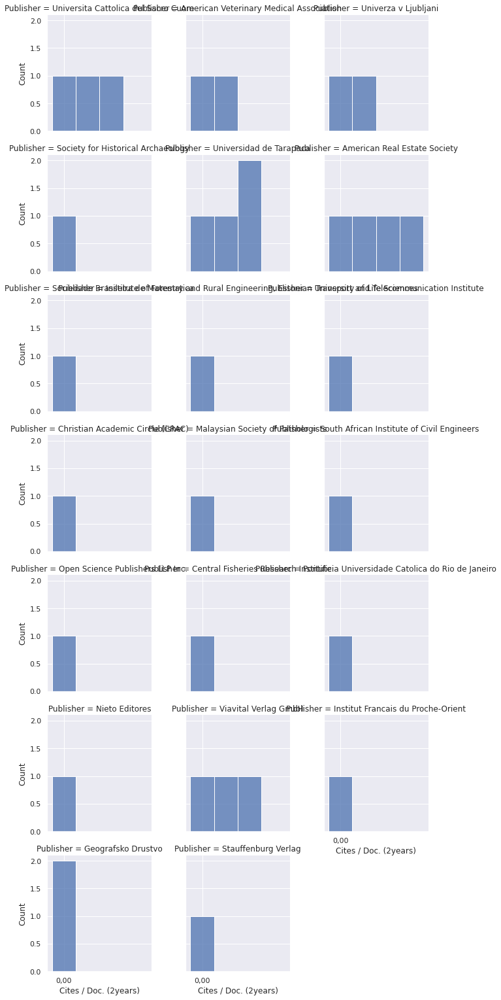

In [ ]:
# Cites / Doc. (2years) histograms values of each publisher:
sjr_ranking_sframe = sjr_ranking_sframe_raw.dropna()
# there are 7314 unique publishers in the dataset, therefore i will 
#  filter the dataset to the first 20 publishers and plot their cites/doc distriubtions 
subset_of_publishers = sjr_ranking_sframe['Publisher'].unique()[:20]
sjr_ranking_sframe = sjr_ranking_sframe.filter_by(list(subset_of_publishers), 'Publisher')

g = sns.FacetGrid(sjr_ranking_sframe.to_dataframe(), col="Publisher", 
                  sharex=True, col_wrap=3)
g.map_dataframe(sns.histplot, x="Cites / Doc. (2years)")